In [14]:
# 2D Linear elastic with isotropic material
import matplotlib.pyplot as plt
from dolfin import *
from mshr import *
# from fenics import *
from ufl import nabla_grad
from ufl import nabla_div
import numpy as np
import math
%matplotlib inline


In [15]:
'''Create mesh ----------------------------------------------------------------'''
R = 0.25  # fiber radius
L = 1.  # Length of the unit cell or representative volume element (RVE)
N = 84  # mesh density
rectangle = Rectangle(Point(0., 0.), Point(L, L))
# domain = rectangle
# domain.set_subdomain(1, rectangle)
circle = Circle(Point(0.5, 0.5), R, segments=2*N)
domain = rectangle
domain.set_subdomain(1, rectangle - circle)
domain.set_subdomain(2, circle)


mesh = generate_mesh(domain, N)
subdomains = MeshFunction("size_t", mesh, 2, mesh.domains())

In [16]:
'''
# Periodic boundary condition definition
# Sub domain for Periodic boundary condition
'''
class PeriodicBoundary(SubDomain):

    # Left boundary is "target domain" G
    def inside(self, x, on_boundary):
        # return True if on left or bottom boundary AND NOT on one of the two corners (0, 1) and (1, 0)
        return bool((near(x[0], 0) or near(x[1], 0)) and
                    (not ((near(x[0], 0) and near(x[1], 1)) or
                          (near(x[0], 1) and near(x[1], 0)))) and on_boundary)

    def map(self, x, y):
        if near(x[0], 1) and near(x[1], 1):
            y[0] = x[0] - 1.
            y[1] = x[1] - 1.
        elif near(x[0], 1):
            y[0] = x[0] - 1.
            y[1] = x[1]
        else:   # near(x[1], 1)
            y[0] = x[0]
            y[1] = x[1] - 1.


In [17]:
'''Define material properties: E and \nu'''
E_f = 80e9
nu_f = 0.2
E_m = 4.2e9
nu_m = 0.34


class young_modulus_E(UserExpression):
    def set_E_value(self, E_0, E_1):
        self.E_0, self.E_1 = E_0, E_1

    def eval(self, value, x):
        if math.sqrt((x[0]-0.5) ** 2 + (x[1]-0.5) ** 2) <= R + DOLFIN_EPS:
            value[0] = self.E_0
        else:
            value[0] = self.E_1

    def value_shape(self):
        # return (1,)
        return ()


E = young_modulus_E(degree=0)
E.set_E_value(E_f, E_m)


class Nu(UserExpression):
    def set_nu_value(self, nu_0, nu_1):
        self.nu_0, self.nu_1 = nu_0, nu_1

    def eval(self, value, x):
        if math.sqrt(x[0] ** 2 + x[1] ** 2) <= R + DOLFIN_EPS:
            value[0] = self.nu_0
        else:
            value[0] = self.nu_1

    def value_shape(self):
        # return (1,)
        return ()


nu = Nu(degree=0)
nu.set_nu_value(nu_f, nu_m)

# E = 80e9
# nu = 0.3
lambda_1 = E * nu / ((1.0 + nu) * (1.0 - 2.0 * nu))
lambda_2 = E / (2.0 * (1.0 + nu))
C11 = C22 = C33 = lambda_1 + 2 * lambda_2
C12 = lambda_1
C66 = lambda_2
C = as_matrix([[C11, C12, 0.], [C12, C22, 0.], [0., 0., C66]])
# S = inv(C)


In [18]:
'''Define elasticity problem'''
def eps(v):
    return sym(grad(v))


def strain2voigt(e):
    return as_vector([e[0, 0], e[1, 1], 2*e[0, 1]])


def voigt2stress(s):
    return as_tensor([[s[0], s[2]], [s[2], s[1]]])


def sigma(C, v):
    return voigt2stress(dot(C, strain2voigt(eps(v))))

In [19]:
'''Define boundaries conditions'''

class Top(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], L) and on_boundary


class Left(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], 0) and on_boundary


class Bottom(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[1], 0) and on_boundary


class Right(SubDomain):
    def inside(self, x, on_boundary):
        return near(x[0], L) and on_boundary


# exterior boundaries MeshFunction
boundaries = MeshFunction("size_t", mesh, 1)
# boundaries.set_all(0)
Top().mark(boundaries, 1)
Left().mark(boundaries, 2)
Bottom().mark(boundaries, 3)
Right().mark(boundaries, 4)
# ds = Measure('ds')[boundaries]
dx = Measure('dx', domain=mesh, subdomain_data=subdomains)
ds = Measure('ds', domain=mesh, subdomain_data=boundaries)

bcs = [
    # bc_Center,
]



In [20]:
'''Define variational problem'''
# Define function space
V = VectorFunctionSpace(mesh, "Lagrange", 2,
                        constrained_domain=PeriodicBoundary())
u = TrialFunction(V)
v = TestFunction(V)
u0 = Function(V, name='Displacement')
u1 = Function(V, name='Displacement')
u2 = Function(V, name='Displacement')
# d = u.geometric_dimension()
# print(d)  # - chieu cua hinh hoc 2D

a = inner(sigma((C), u), eps(v))*dx
# In the assembly these act like (vx, 0), (0, vy) but vx, vy are scalars
# vx, vy = v[0], v[1]
# dofs_x = V.sub(0).dofmap().dofs()
# dofs_y = V.sub(1).dofmap().dofs()

l0 = dot(C, strain2voigt(eps(v)))[0]*dx
l1 = dot(C, strain2voigt(eps(v)))[1]*dx
l2 = dot(C, strain2voigt(eps(v)))[2]*dx


In [21]:
'''Solve the systems'''
# ------------------------
solve(a == l0, u0, bcs)
solve(a == l1, u1, bcs)
solve(a == l2, u2, bcs)

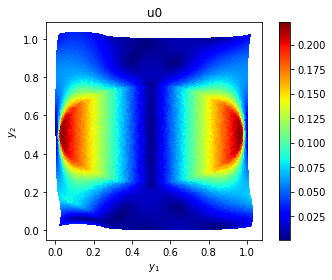

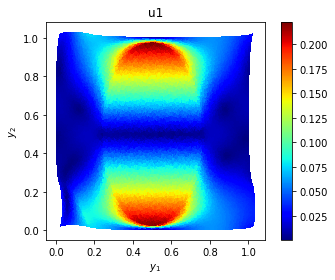

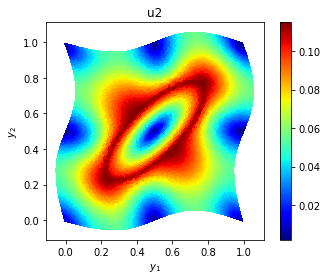

In [22]:
'''Visualization'''
plt.jet()
plt.figure(1)
plt.colorbar(plot(u0, title='u0', mode='displacement'))
# plt.loglog()
plt.xlabel('$y_1$')
plt.ylabel('$y_2$')
plt.savefig('results/result_grad_e0.eps', format='eps')
# np.savetxt("results/periodic_u0.txt", np.array(u0.vector()), fmt="%s")
# file = File("results/periodic_u0.xml")
# file << u0

plt.figure(2)
plt.colorbar(plot(u1, title='u1', mode='displacement'))
plt.xlabel('$y_1$')
plt.ylabel('$y_2$')
plt.savefig('results/result_grad_e1.eps', format='eps')

plt.figure(3)
plt.colorbar(plot(u2, title='u2', mode='displacement'))
plt.xlabel('$y_1$')
plt.ylabel('$y_2$')
plt.savefig('results/result_grad_e2.eps', format='eps')

# plt.figure(4, dpi=256)
# p4 = plot(mesh, title='Mesh')
# plt.xlabel('$y_1$')
# plt.ylabel('$y_2$')
# plt.savefig('results/mesh.eps', format='eps')

'''Save solution to file in VTK format
vtkfile = File('test/isotropic_elasticity_beam.pvd')
vtkfile << u'''

# plt.hold(True)
plt.show()


In [26]:
# import os
# os.system('jupyter nbconvert --to html Homo_2D_isotropic_elasticity.ipynb')
# os.system('jupyter nbconvert --to pdf Homo_2D_isotropic_elasticity.ipynb')

256

In [ ]:
''' Calculate numerical integration of Homogenized elastic properties (efficient tensor) '''

# Compute gradient

# V_g = VectorFunctionSpace(mesh, 'Lagrange', 2)
v_g = TestFunction(V)
w_g = TrialFunction(V)

a = inner(w_g, v_g)*dx

# for w1 (or u1)
L_w1 = inner(grad(u1), v_g)*dx
grad_u1 = Function(V)
solve(a == L_w1, grad_u1)
grad_u1_y1, grad_u1_y2 = grad_u1.split(deepcopy=True)  # extract components

# Homogenized tensor A11
A11_expression = Expression(
    'A_y * ( 1 + grad_u1_y1 )', A_y=A_y, grad_u1_y1=grad_u1_y1, degree=1)
A11 = assemble(project(A11_expression, V)*dx)

# for w2 (or u2)
L_w2 = inner(grad(u2), v_g)*dx
grad_u2 = Function(V)
solve(a == L_w2, grad_u2)
grad_u2_y1, grad_u2_y2 = grad_u2.split(deepcopy=True)  # extract components

# Homogenized tensor A22
A22_expression = Expression(
    'A_y * ( 1 + grad_u2_y2 )', A_y=A_y, grad_u2_y2=grad_u2_y2, degree=1)
A22 = assemble(project(A22_expression, V)*dx)
# print(assemble(A22*dx))

# Homogenized tensor A12
A12_expression = Expression(
    'A_y * ( grad_u2_y1 )', A_y=A_y, grad_u2_y1=grad_u2_y1, degree=1)
A12 = assemble(project(A12_expression, V)*dx)

# Homogenized tensor A21
A21_expression = Expression(
    'A_y * ( grad_u1_y2 )', A_y=A_y, grad_u1_y2=grad_u1_y2, degree=1)
A21 = assemble(project(A21_expression, V)*dx)


A_ij = np.array([[A11, A12], [ A21, A22]])
print('The homogenized effective coefficient matrix: \n', A_ij)
print('The homogenized effective coefficient component A11 = ', A11)
print('The homogenized effective coefficient component A12 = ', A12)
print('The homogenized effective coefficient component A21 = ', A21)
print('The homogenized effective coefficient component A22 = ', A22)
# print(A11-A22)

